In [ ]:
# from google.colab import files

# uploaded = files.upload()

# for fn in uploaded.keys():
#   print('User uploaded file "{name}" with length {length} bytes'.format(
#       name=fn, length=len(uploaded[fn])))

# Then move kaggle.json into the folder where the API expects to find it.
! mkdir -p ~/.kaggle/ && mv kaggle.json ~/.kaggle/ && chmod 600 ~/.kaggle/kaggle.json

In [ ]:
! kaggle datasets download -d abdallahalidev/plantvillage-dataset
! kaggle datasets download -d kareem3egm/cucumber-plant-diseases-dataset

100% 2.04G/2.04G [00:23<00:00, 65.2MB/s]
100% 2.04G/2.04G [00:23<00:00, 94.8MB/s]
 99% 755M/760M [00:19<00:00, 49.9MB/s]
100% 760M/760M [00:19<00:00, 41.5MB/s]


In [ ]:
! wget -O ibean-training-set.zip https://storage.googleapis.com/ibeans/train.zip
! wget -O ibean-validation-set.zip https://storage.googleapis.com/ibeans/validation.zip
! wget -O ibean-testing-set.zip https://storage.googleapis.com/ibeans/test.zip

--2021-06-02 05:04:50--  https://storage.googleapis.com/ibeans/train.zip
Resolving storage.googleapis.com (storage.googleapis.com)... 142.250.101.128, 142.250.141.128, 2607:f8b0:4023:c06::80, ...
Connecting to storage.googleapis.com (storage.googleapis.com)|142.250.101.128|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 143812152 (137M) [application/zip]
Saving to: ‘ibean-training-set.zip’

ibean-training-set. 100%[===================>] 137.15M  73.6MB/s    in 1.9s    

2021-06-02 05:04:52 (73.6 MB/s) - ‘ibean-training-set.zip’ saved [143812152/143812152]

--2021-06-02 05:04:52--  https://storage.googleapis.com/ibeans/validation.zip
Resolving storage.googleapis.com (storage.googleapis.com)... 142.250.101.128, 142.250.141.128, 2607:f8b0:4023:c06::80, ...
Connecting to storage.googleapis.com (storage.googleapis.com)|142.250.101.128|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 18504213 (18M) [application/zip]
Saving to: ‘ibean-validat

In [ ]:
import zipfile
import os, shutil

In [ ]:
def extract(source, destination):
    zip = zipfile.ZipFile(source, "r")
    zip.extractall(destination)
    zip.close()
    print("[SUCCESS] {} berhasil diekstrak!".format(os.path.basename(source)))

In [ ]:
# PlantVillage and Cucumber dataset

plantvillage_src = "/content/plantvillage-dataset.zip"
cucumber_src = "/content/cucumber-plant-diseases-dataset.zip"

destination = "/content/dataset"

extract(plantvillage_src, destination)
extract(cucumber_src, destination)

# iBean dataset

ibean_train_src = "/content/ibean-training-set.zip"
ibean_val_src = "/content/ibean-validation-set.zip"
ibean_test_src = "/content/ibean-testing-set.zip"

destination = "/content/dataset/ibean-dataset"

extract(ibean_train_src, destination)
extract(ibean_val_src, destination)
extract(ibean_test_src, destination)

[SUCCESS] plantvillage-dataset.zip berhasil diekstrak!
[SUCCESS] cucumber-plant-diseases-dataset.zip berhasil diekstrak!
[SUCCESS] ibean-training-set.zip berhasil diekstrak!
[SUCCESS] ibean-validation-set.zip berhasil diekstrak!
[SUCCESS] ibean-testing-set.zip berhasil diekstrak!


In [ ]:
def take_and_combine(path, max):
    target = "/content/dataset_combined"
    try:
        for root, dirs, files in os.walk(path, topdown=True):
            if root == path or len(files) == 0:
                continue
            num = 0
            source_path = os.path.join(path, os.path.basename(root))
            target_path = os.path.join(target, os.path.basename(root))
            os.makedirs(target_path)
            for filename in files:
                if num == max:
                    break
                file_source = os.path.join(root, filename)
                file_target = os.path.join(target_path, filename)
                shutil.copy(file_source, file_target)
                num += 1
            print("[SUCCESS] {} berhasil disalin!".format(os.path.basename(target_path)))
    except FileExistsError as error:
        print(error)

def list_dataset(path):
    total = 0
    labels = []
    count = []
    for root, dirs, files in os.walk(path):
        if root == path:
            n_class = len(dirs)
            continue
        basename = os.path.basename(root)
        # print("{} data di kelas {}".format(len(files), basename))
        labels.append(os.path.basename(root))
        count.append(len(files))
        total += len(files)
    print("\nJumlah kelas = {}".format(n_class))
    print("Total data = {}".format(total))
    return labels, count

In [ ]:
max = 250

take_and_combine("/content/dataset/plantvillage dataset/color", max)                # PlantVillage
take_and_combine("/content/dataset/Cucumber plant diseases dataset/training", max)  # Cucumber
take_and_combine("/content/dataset/ibean-dataset/train", max)                       # iBean

[SUCCESS] Orange___Haunglongbing_(Citrus_greening) berhasil disalin!
[SUCCESS] Peach___Bacterial_spot berhasil disalin!
[SUCCESS] Cherry_(including_sour)___Powdery_mildew berhasil disalin!
[SUCCESS] Potato___Early_blight berhasil disalin!
[SUCCESS] Strawberry___Leaf_scorch berhasil disalin!
[SUCCESS] Grape___Leaf_blight_(Isariopsis_Leaf_Spot) berhasil disalin!
[SUCCESS] Blueberry___healthy berhasil disalin!
[SUCCESS] Tomato___Spider_mites Two-spotted_spider_mite berhasil disalin!
[SUCCESS] Pepper,_bell___healthy berhasil disalin!
[SUCCESS] Apple___Apple_scab berhasil disalin!
[SUCCESS] Peach___healthy berhasil disalin!
[SUCCESS] Strawberry___healthy berhasil disalin!
[SUCCESS] Corn_(maize)___healthy berhasil disalin!
[SUCCESS] Grape___Black_rot berhasil disalin!
[SUCCESS] Grape___Esca_(Black_Measles) berhasil disalin!
[SUCCESS] Potato___Late_blight berhasil disalin!
[SUCCESS] Corn_(maize)___Common_rust_ berhasil disalin!
[SUCCESS] Squash___Powdery_mildew berhasil disalin!
[SUCCESS] Tom

In [ ]:
# Hapus directory (untuk testing)
# shutil.rmtree("/content/dataset_combined")
shutil.rmtree("/content/dataset_combined/Apple___Apple_scab")
shutil.rmtree("/content/dataset_combined/Apple___healthy")
shutil.rmtree("/content/dataset_combined/Apple___Black_rot")
shutil.rmtree("/content/dataset_combined/Apple___Cedar_apple_rust")
shutil.rmtree("/content/dataset_combined/Peach___Bacterial_spot")
shutil.rmtree("/content/dataset_combined/Peach___healthy")
shutil.rmtree("/content/dataset_combined/Cherry_(including_sour)___Powdery_mildew")
shutil.rmtree("/content/dataset_combined/Cherry_(including_sour)___healthy")
shutil.rmtree("/content/dataset_combined/Orange___Haunglongbing_(Citrus_greening)")

In [ ]:
try:
    os.rename("/content/dataset_combined/Ill_cucumber", "/content/dataset_combined/Cucumber__Ill")
    os.rename("/content/dataset_combined/good_Cucumber", "/content/dataset_combined/Cucumber__healthy")
    os.rename("/content/dataset_combined/healthy", "/content/dataset_combined/Bean__healthy")
    os.rename("/content/dataset_combined/bean_rust", "/content/dataset_combined/Bean__Bean_rust")
    os.rename("/content/dataset_combined/angular_leaf_spot", "/content/dataset_combined/Bean__Angular_leaf_spot")
except:
    print("Folder tidak ditemukan!")

Folder tidak ditemukan!


In [ ]:
labels, count = list_dataset("/content/dataset_combined")


Jumlah kelas = 34
Total data = 8371


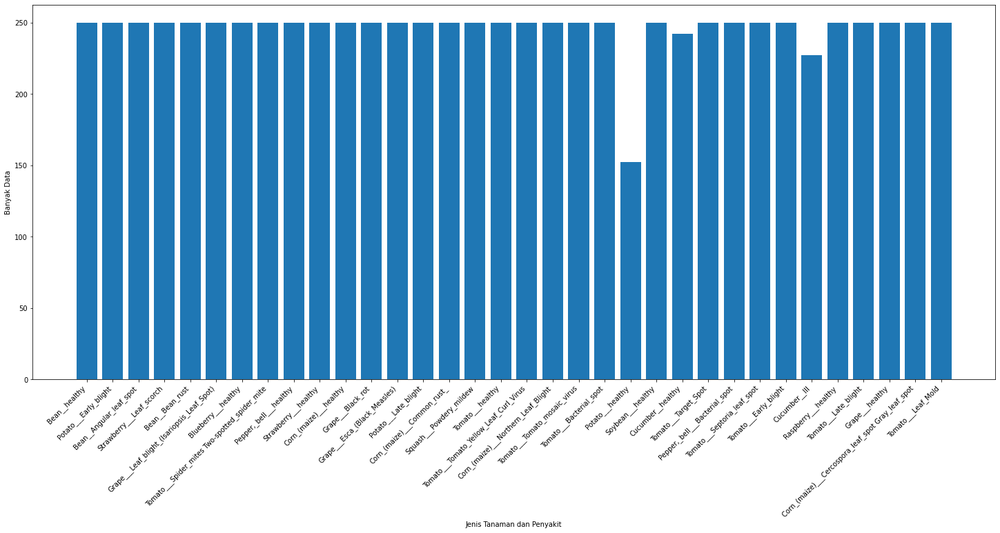

In [ ]:
import matplotlib.pyplot as plt
import numpy as np

x = np.arange(len(labels))
y = count

plt.figure(figsize=(25,10))
plt.bar(x, y, tick_label=labels)
plt.xlabel('Jenis Tanaman dan Penyakit')
plt.ylabel('Banyak Data')
plt.xticks(rotation=45, ha='right')
plt.show()

In [ ]:
print(labels)

['Orange___Haunglongbing_(Citrus_greening)', 'Peach___Bacterial_spot', 'Cherry_(including_sour)___Powdery_mildew', 'Bean__healthy', 'Potato___Early_blight', 'Bean__Angular_leaf_spot', 'Strawberry___Leaf_scorch', 'Bean__Bean_rust', 'Grape___Leaf_blight_(Isariopsis_Leaf_Spot)', 'Blueberry___healthy', 'Tomato___Spider_mites Two-spotted_spider_mite', 'Pepper,_bell___healthy', 'Apple___Apple_scab', 'Peach___healthy', 'Strawberry___healthy', 'Corn_(maize)___healthy', 'Grape___Black_rot', 'Grape___Esca_(Black_Measles)', 'Potato___Late_blight', 'Corn_(maize)___Common_rust_', 'Squash___Powdery_mildew', 'Tomato___healthy', 'Tomato___Tomato_Yellow_Leaf_Curl_Virus', 'Corn_(maize)___Northern_Leaf_Blight', 'Tomato___Tomato_mosaic_virus', 'Apple___Cedar_apple_rust', 'Tomato___Bacterial_spot', 'Apple___healthy', 'Potato___healthy', 'Soybean___healthy', 'Cucumber__healthy', 'Tomato___Target_Spot', 'Pepper,_bell___Bacterial_spot', 'Tomato___Septoria_leaf_spot', 'Tomato___Early_blight', 'Cucumber__Ill', 

In [ ]:
index = labels.index('Orange___Haunglongbing_(Citrus_greening)')
num_data = count[index+1]
print(num_data)

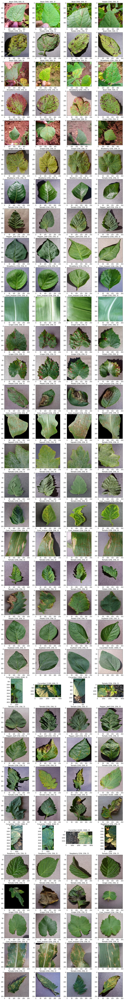

In [ ]:
import matplotlib.pyplot as plt
import matplotlib.image as mpimg

i = 0
nrows = 43
ncols = 4

fig = plt.gcf()
fig.set_size_inches(ncols*4, nrows*4)

for root, dirs, files in os.walk("/content/dataset_combined"):
    if len(dirs) != 0:
        continue
    for filename in files[:4]:
        i += 1
        filepath = os.path.join(root, filename)
        img = mpimg.imread(filepath)
        label = os.path.basename(root).split("__")[0]
        shapes = img.shape
        plt.title("{} {}".format(label, shapes))
        plt.subplot(nrows, ncols, i)
        plt.imshow(img)
plt.show()


In [ ]:
! pip install split-folders

import splitfolders

In [ ]:
main_dir = "/content/dataset_split"
train_dir = os.path.join(main_dir, "train")
val_dir = os.path.join(main_dir, "val")

In [ ]:
splitfolders.ratio("/content/dataset_combined", output=main_dir, seed=42, ratio=(.8, .2), group_prefix=None) #(train:val)

Copying files: 19414 files [00:05, 3516.89 files/s]


In [ ]:
# # define the undersampling method
# undersample = CondensedNearestNeighbour(n_neighbors=1)
# # transform the dataset
# X, y = undersample.fit_resample(X, y)

In [ ]:
classes_dir = os.listdir(main_dir + "/train")
n_class = len(classes_dir)

In [ ]:
from tensorflow.keras.preprocessing.image import ImageDataGenerator

train_datagen = ImageDataGenerator(
    rescale=1./255,
    shear_range=0.2,
    zoom_range=0.2,
    rotation_range=45,
    horizontal_flip=True,
    fill_mode="nearest"
)
val_datagen = ImageDataGenerator(
    rescale=1./255,
    shear_range=0.2,
    zoom_range=0.2,
    rotation_range=45,
    horizontal_flip=True,
    fill_mode="nearest"
)

In [ ]:
train_generator = train_datagen.flow_from_directory(
    train_dir,
    target_size=(256,256),
    batch_size=32,
    class_mode="sparse"
)
val_generator = val_datagen.flow_from_directory(
    val_dir,
    target_size=(256,256),
    batch_size=32,
    class_mode="sparse"
)

Found 15525 images belonging to 43 classes.
Found 3888 images belonging to 43 classes.


In [ ]:
from tensorflow.keras.models import Sequential
from tensorflow.keras import layers

In [ ]:
model = Sequential([
    layers.Conv2D(32, (3,3), strides=(1,1), activation="relu", input_shape=(256,256,3)),
    layers.MaxPooling2D(pool_size=(2,2)),
    layers.Conv2D(64, (3,3), activation="relu"),
    layers.MaxPooling2D(pool_size=(2,2)),
    layers.Conv2D(64, (3,3), activation="relu"),
    layers.MaxPooling2D(pool_size=(2,2)),
    layers.Flatten(),
    layers.Dense(512, activation="relu"),
    layers.Dense(n_class, activation="softmax")
])
model.summary()

Model: "sequential_4"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
conv2d_12 (Conv2D)           (None, 254, 254, 32)      896       
_________________________________________________________________
max_pooling2d_12 (MaxPooling (None, 127, 127, 32)      0         
_________________________________________________________________
conv2d_13 (Conv2D)           (None, 125, 125, 64)      18496     
_________________________________________________________________
max_pooling2d_13 (MaxPooling (None, 62, 62, 64)        0         
_________________________________________________________________
conv2d_14 (Conv2D)           (None, 60, 60, 64)        36928     
_________________________________________________________________
max_pooling2d_14 (MaxPooling (None, 30, 30, 64)        0         
_________________________________________________________________
flatten_4 (Flatten)          (None, 57600)            

In [ ]:
import tensorflow as tf
model.compile(
    loss="sparse_categorical_crossentropy",
    optimizer=tf.optimizers.Adam(),
    metrics=["accuracy"]
)

In [ ]:
# from google.colab import drive

# drive.mount('/content/gdrive')
# checkpoint = tf.keras.callbacks.ModelCheckpoint(
#     filepath='/content/gdrive/My Drive/ckp/model-{epoch:03d}.ckpt',
#     save_weights_only=True,
#     monitor='val_acc',
#     mode='max',
#     save_best_only=True, 
#     verbose=0)

In [ ]:
from keras.callbacks import TensorBoard, Callback

class accuracyStop (Callback) :
    def on_epoch_end(self, epoch, logs={}) :
        if(logs.get("accuracy") > 0.90 and logs.get("val_accuracy") > 0.88) : 
            print("\nTingkat akurasi 90% tercapai!")
            self.model.stop_training = True

In [ ]:
callbacks = accuracyStop()

history = model.fit(train_generator, 
                    epochs=50, 
                    validation_data=val_generator, 
                    batch_size=32,
                    steps_per_epoch=100,
                    validation_steps=100,
                    callbacks=[callbacks],
                    verbose=2)

Epoch 1/50
100/100 - 94s - loss: 3.3119 - accuracy: 0.1403 - val_loss: 2.3811 - val_accuracy: 0.3178
Epoch 2/50
100/100 - 93s - loss: 2.0794 - accuracy: 0.4044 - val_loss: 2.0187 - val_accuracy: 0.4187
Epoch 3/50
100/100 - 92s - loss: 1.6976 - accuracy: 0.4947 - val_loss: 1.4584 - val_accuracy: 0.5641
Epoch 4/50
100/100 - 94s - loss: 1.3679 - accuracy: 0.6028 - val_loss: 1.2737 - val_accuracy: 0.6112
Epoch 5/50
100/100 - 93s - loss: 1.2395 - accuracy: 0.6203 - val_loss: 1.1308 - val_accuracy: 0.6450
Epoch 6/50
100/100 - 94s - loss: 1.1375 - accuracy: 0.6491 - val_loss: 1.1046 - val_accuracy: 0.6534
Epoch 7/50
100/100 - 92s - loss: 1.0660 - accuracy: 0.6688 - val_loss: 1.3035 - val_accuracy: 0.6119
Epoch 8/50
100/100 - 93s - loss: 1.0007 - accuracy: 0.6825 - val_loss: 1.0079 - val_accuracy: 0.6822
Epoch 9/50
100/100 - 93s - loss: 0.8689 - accuracy: 0.7247 - val_loss: 1.1934 - val_accuracy: 0.6372
Epoch 10/50
100/100 - 127s - loss: 0.8464 - accuracy: 0.7306 - val_loss: 0.8431 - val_accur

In [ ]:
import matplotlib.pyplot as plt

plt.plot(history.history["accuracy"])
plt.plot(history.history["val_accuracy"])
plt.title("Akurasi Model")
plt.ylabel("Akurasi")
plt.xlabel("Epoch")
plt.legend(["train", "test"], loc="upper left")
plt.show

In [ ]:
plt.plot(history.history["loss"])
plt.plot(history.history["val_loss"])
plt.title("Loss Model")
plt.ylabel("Loss")
plt.xlabel("Epoch")
plt.legend(["train", "test"], loc="upper right")
plt.show

In [ ]:
converter = tf.lite.TFLiteConverter.from_keras_model(model)
tflite_model = converter.convert()

In [ ]:
with tf.io.gfile.GFile("model.tflite", "wb") as f :
    f.write(tflite_model)

In [ ]:
import numpy as np
from google.colab import files
from keras.preprocessing import image

uploaded = files.upload()

for fn in uploaded.keys():
 
  # predicting images
  path = fn
  img = image.load_img(path, target_size=(150, 150))
  x = image.img_to_array(img)
  x = np.expand_dims(x, axis=0)

  images = np.vstack([x])
  classes = model.predict(images)
  print(fn)
  print(classes)

In [ ]:
keras_model = tf.keras.models.load_model("/content/model.h5")

In [ ]:
keras_model.summary()

Model: "sequential_1"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
conv2d_3 (Conv2D)            (None, 254, 254, 32)      896       
_________________________________________________________________
max_pooling2d_3 (MaxPooling2 (None, 127, 127, 32)      0         
_________________________________________________________________
conv2d_4 (Conv2D)            (None, 125, 125, 64)      18496     
_________________________________________________________________
max_pooling2d_4 (MaxPooling2 (None, 62, 62, 64)        0         
_________________________________________________________________
conv2d_5 (Conv2D)            (None, 60, 60, 64)        36928     
_________________________________________________________________
max_pooling2d_5 (MaxPooling2 (None, 30, 30, 64)        0         
_________________________________________________________________
flatten_1 (Flatten)          (None, 57600)            

In [ ]:
keras_model.save_weights("/content/model_weight")

In [ ]:
os.path.getsize("/content/model_weight.data-00000-of-00001")

177735329